# 1. Data Collection


1.1. Importing Libraries

In [ ]:
# Import & load libraries

import numpy as np
import pandas as pd
import os
import cv2
import random
import shutil
import collections

from collections import Counter, defaultdict
from google.colab import drive

# Visual libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

# DL & ML libraries
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow import keras
from tensorflow.keras.regularizers import l2

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras import layers, Model, models, regularizers

from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Input, GlobalAveragePooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping


In [ ]:
# Mounting google drive
drive.mount('/content/drive')

# Defining file path
dataset_path = '/content/drive/MyDrive/Brain Tumor/MergedData'

Mounted at /content/drive


1.2 Loading Dataset

In [ ]:
# Calculate class distributions

class_distribution = defaultdict(int)

for class_name in os.listdir(dataset_path):
    class_dir = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_dir):
        image_count = len([f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))])
        class_distribution[class_name] = image_count

total_images = sum(class_distribution.values())

# Print results
print(f"Total images: {total_images}\n")
for class_name, count in class_distribution.items():
    print(f"{class_name}: {count} images")

Total images: 3264

no_tumor: 500 images
meningioma_tumor: 937 images
pituitary_tumor: 901 images
glioma_tumor: 926 images


1.3 Visualize Raw Images

In [ ]:
# To visualize raw images directly from drive

def visualize_from_raw_dir(dataset_path, images_per_class=5):
    # Dictionary to store file paths per class
    class_image_paths = defaultdict(list)

    # Collect image paths grouped by class
    for class_name in os.listdir(dataset_path):
        class_dir = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_dir):
            images = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            for img_name in images[:images_per_class]:
                img_path = os.path.join(class_dir, img_name)
                class_image_paths[class_name].append(img_path)

    num_classes = len(class_image_paths)
    plt.figure(figsize=(images_per_class * 2, num_classes * 2))

    for row, (class_name, img_paths) in enumerate(class_image_paths.items()):
        for col, img_path in enumerate(img_paths):
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax = plt.subplot(num_classes, images_per_class, row * images_per_class + col + 1)
            plt.imshow(img)
            plt.title(class_name, fontsize=8)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

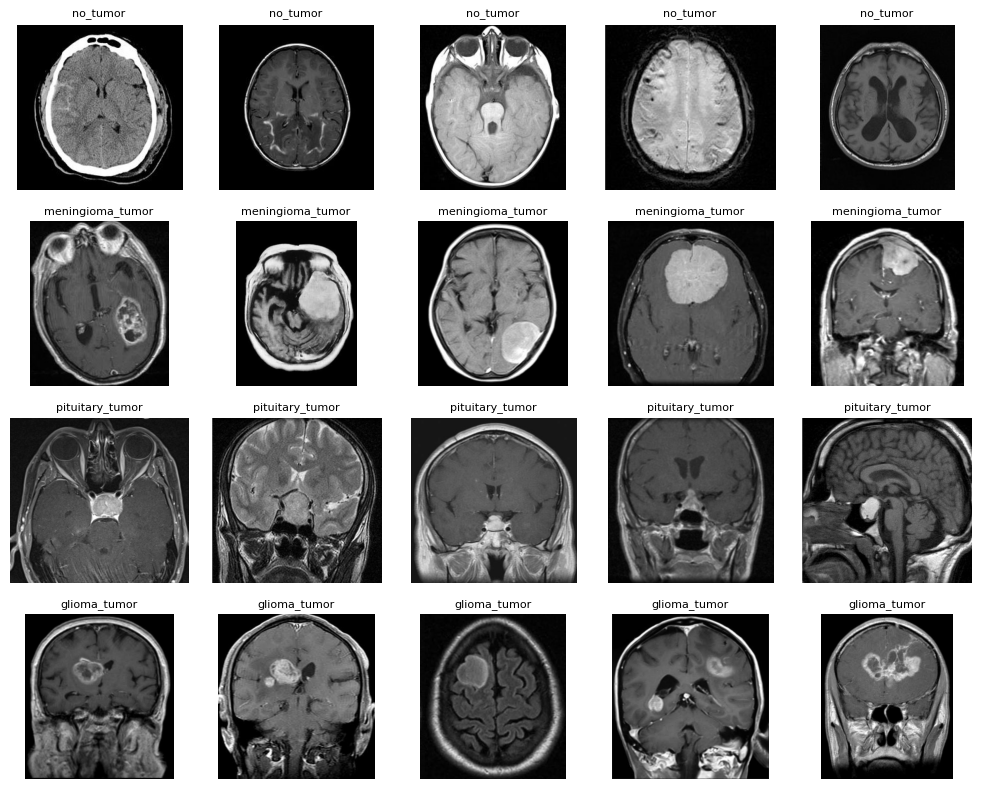

In [ ]:
visualize_from_raw_dir(dataset_path)

1.4. Splitting dataset

In [ ]:
# Set constants

SPLIT_SEED = 42
TRAINING_SEED = 2025 # Change every run - 42, 84, 123, 456, 789, 987, 1111, 2025, 2525, 5252
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE

tf.random.set_seed(TRAINING_SEED)
np.random.seed(TRAINING_SEED)
random.seed(TRAINING_SEED)
tf.config.experimental.enable_op_determinism()

In [ ]:
# Splitting Dataset
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    validation_split=0.3,  # remaining 30% to be split into val/test
    subset="training",
    seed=SPLIT_SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True
)

# 30% val+test
temp_ds = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    validation_split=0.3,
    subset="validation",
    seed=SPLIT_SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

# Split temp into val and test
val_size = tf.data.experimental.cardinality(temp_ds) // 2
val_ds = temp_ds.take(val_size)
test_ds = temp_ds.skip(val_size)

Found 3264 files belonging to 4 classes.
Using 2285 files for training.
Found 3264 files belonging to 4 classes.
Using 979 files for validation.


In [ ]:
print("Train batches:", tf.data.experimental.cardinality(train_ds).numpy())
print("Val batches:", tf.data.experimental.cardinality(val_ds).numpy())
print("Test batches:", tf.data.experimental.cardinality(test_ds).numpy())

Train batches: 72
Val batches: 15
Test batches: 16


In [ ]:
raw_train_ds = tf.keras.utils.image_dataset_from_directory(
    dataset_path,
    image_size=(224, 224),
    batch_size=32
)

# Save class names
class_names = raw_train_ds.class_names
print("Classes:", class_names)

Found 3264 files belonging to 4 classes.
Classes: ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']


In [ ]:
# Calculating distribution for each classes after split

def count_class_distribution(dataset):
    class_counts = Counter()
    for images, labels in dataset.unbatch():
        label = int(labels.numpy())
        class_counts[label] += 1
    return dict(sorted({class_names[k]: v for k, v in class_counts.items()}.items()))

train_dist = count_class_distribution(train_ds)
val_dist   = count_class_distribution(val_ds)
test_dist  = count_class_distribution(test_ds)

print("Train Distribution:", train_dist)
print("Validation Distribution:", val_dist)
print("Test Distribution:", test_dist)

Train Distribution: {'glioma_tumor': 646, 'meningioma_tumor': 654, 'no_tumor': 354, 'pituitary_tumor': 631}
Validation Distribution: {'glioma_tumor': 151, 'meningioma_tumor': 127, 'no_tumor': 76, 'pituitary_tumor': 126}
Test Distribution: {'glioma_tumor': 136, 'meningioma_tumor': 152, 'no_tumor': 76, 'pituitary_tumor': 135}


1.5. Visualize Dataset Distribution

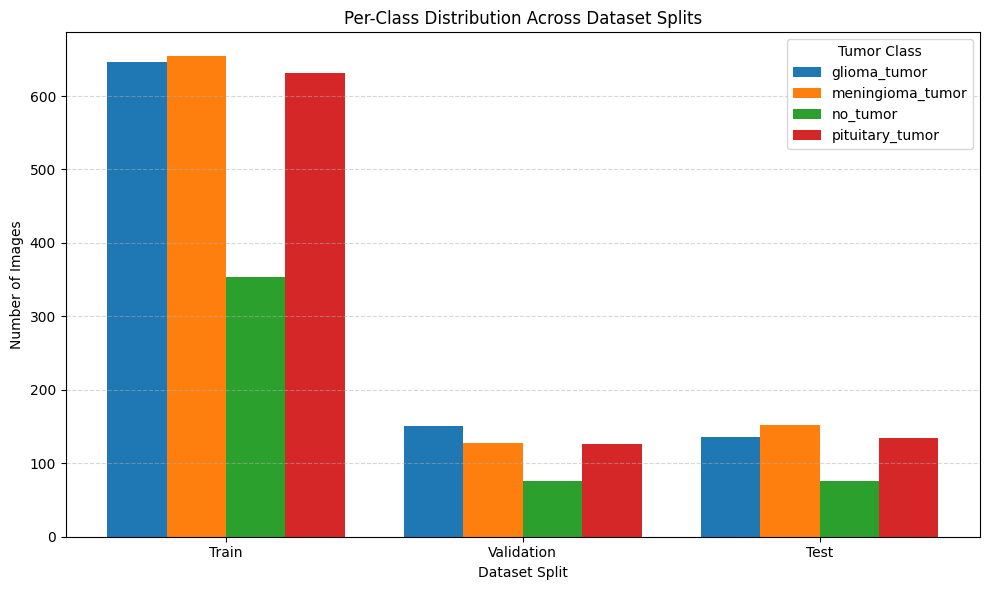

In [ ]:
# Distrubution Barchart

splits = ['Train', 'Validation', 'Test']
class_names = list(train_dist.keys())

# Get values for each class in each split
data = {
    'Train': [train_dist.get(cls, 0) for cls in class_names],
    'Validation': [val_dist.get(cls, 0) for cls in class_names],
    'Test': [test_dist.get(cls, 0) for cls in class_names]
}

x = np.arange(len(splits))  # [0, 1, 2] for Train, Val, Test
bar_width = 0.2

fig, ax = plt.subplots(figsize=(10, 6))

for i, cls in enumerate(class_names):
    values = [data[split][i] for split in splits]
    ax.bar(x + (i - 1.5) * bar_width, values, width=bar_width, label=cls)

ax.set_xlabel('Dataset Split')
ax.set_ylabel('Number of Images')
ax.set_title('Per-Class Distribution Across Dataset Splits')
ax.set_xticks(x)
ax.set_xticklabels(splits)
ax.legend(title='Tumor Class')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

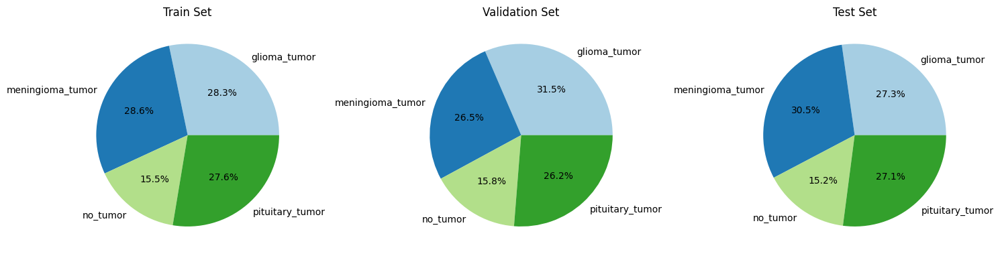

In [ ]:
# Distribution piechart

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
colors = plt.cm.Paired.colors

# distribution categories
distributions = [train_dist, val_dist, test_dist]
splits = ['Train', 'Validation', 'Test']

for i, (dist, split) in enumerate(zip(distributions, splits)):
    labels = list(dist.keys())
    sizes = list(dist.values())
    axes[i].pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors[:len(labels)])
    axes[i].set_title(f'{split} Set')

plt.tight_layout()
plt.show()

# 2. Data Preprocessing

2.1 Preprocessing Pipeline

In [ ]:
# Data augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomRotation(factor=0.02, fill_mode = 'nearest'),
    layers.RandomZoom(height_factor=(-0.2, 0.0), width_factor=None),
    layers.RandomContrast(0.2),
    layers.RandomTranslation(0.01, 0.01, fill_mode='nearest'),
    layers.RandomBrightness(0.1)

])

# Normalization
normalization_layer = layers.Rescaling(1./255)

In [ ]:
# Apply augmentation + normalization to training dataset
train_ds = train_ds.map(lambda x, y: (normalization_layer(data_augmentation(x)), y),
                        num_parallel_calls=tf.data.AUTOTUNE)

# Normalize validation and test datasets
val_ds = val_ds.map(lambda x, y: (normalization_layer(x), y),
                    num_parallel_calls=tf.data.AUTOTUNE)

test_ds = test_ds.map(lambda x, y: (normalization_layer(x), y),
                      num_parallel_calls=tf.data.AUTOTUNE)

# Optimize loading
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

2.2. Visualize Before & After Preprocess

Found 3264 files belonging to 4 classes.
Using 2285 files for training.


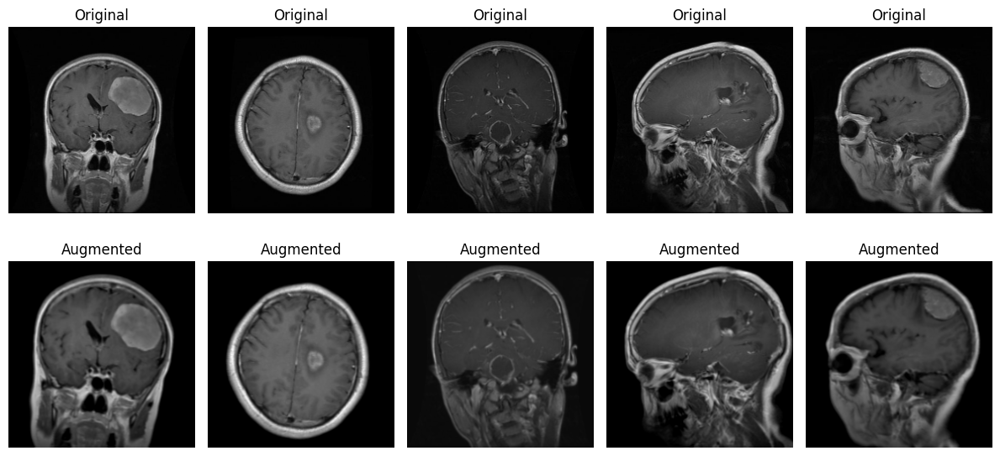

In [ ]:
# Load a fresh, unprocessed batch from dataset (only for visualization)
preview_ds = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    validation_split=0.3,
    subset="training",
    seed=42,
    image_size=IMG_SIZE,
    batch_size=1  # smaller batch to control sampling
)

# Take first 5 raw images (unaltered)
original_images = []
for img_batch, _ in preview_ds.take(5):
    original_images.append(img_batch[0])

original_images = tf.stack(original_images)

# Apply augmentation
augmented_images = data_augmentation(original_images)

# Plot side-by-side
plt.figure(figsize=(12, 6))

# Top row: original
for i in range(5):
    ax = plt.subplot(2, 5, i + 1)
    plt.imshow((original_images[i].numpy() / 255.0))
    plt.title("Original")
    plt.axis("off")

# Bottom row: augmented
for i in range(5):
    ax = plt.subplot(2, 5, i + 6)
    plt.imshow((augmented_images[i].numpy() / 255.0))
    plt.title("Augmented")
    plt.axis("off")

plt.tight_layout()
plt.show()

# 3. Model preparation & Functions

3.1. Class Weights

In [ ]:
# Get class names
class_names = raw_train_ds.class_names
print("Class names:", class_names)

# Flatten the labels
y_preview = []
for _, label in raw_train_ds.unbatch():
    y_preview.append(label.numpy())

y_preview = np.array(y_preview)

# Compute class weights
weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_preview),
    y=y_preview
)
class_weights = dict(enumerate(weights))
print("Class weights:", class_weights)

Class names: ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']
Class weights: {0: np.float64(0.8812095032397408), 1: np.float64(0.8708644610458911), 2: np.float64(1.632), 3: np.float64(0.9056603773584906)}


3.2. Custom Functions

In [ ]:
# Function for callbacks

def get_callbacks(checkpoint_filepath="best_model.keras"):

    callbacks = [
        ModelCheckpoint(
            filepath=checkpoint_filepath,
            monitor='val_loss',
            save_best_only=True,
            verbose=1
        ),
        EarlyStopping(
            monitor='val_loss',
            patience=12,
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        )
    ]
    return callbacks

In [ ]:
# Function to calculate model loss and accuracy

def load_and_evaluate_model(model_path, test_data):

    # Load the model
    model = load_model(model_path)

    # Evaluate on the test dataset
    loss, acc = model.evaluate(test_data, verbose=1)
    print(f"Model from '{model_path}' -> Loss: {loss:.4f}, Accuracy: {acc:.4f}")

    return model, (loss, acc)

In [ ]:
# Function for accuracy and loss plot

def plot_history(model_hist, model, model_name):
  plt.figure(figsize=(16, 8))

  plt.subplot(2, 2, 2)
  plt.plot(model_hist.history['accuracy'], label='Train Accuracy', linestyle='solid', marker='o', color = 'yellowgreen')
  plt.plot(model_hist.history['val_accuracy'], label='Val Accuracy', linestyle='dashed', marker='x', color = 'mediumpurple')
  plt.legend()
  plt.title(f'Accuracy Evolution by Epoch - {model_name}')

  plt.subplot(2, 2, 1)
  plt.plot(model_hist.history['loss'], label='Train Loss', linestyle='solid', marker='o', color = 'yellowgreen')
  plt.plot(model_hist.history['val_loss'], label='Val Loss', linestyle='dashed', marker='x', color = 'mediumpurple')
  plt.legend()
  plt.title(f'Loss Evolution by Epoch  - {model_name}')

  plt.show()

In [ ]:
# Function to predict and evaluate

def evaluate_model(model, dataset, class_names):
    # Predict probabilities
    y_pred_probs = model.predict(dataset, verbose=0)

    # Convert probabilities → predicted class indices
    y_pred = np.argmax(y_pred_probs, axis=1)

    # Extract true labels from dataset
    y_true = np.concatenate([y for _, y in dataset], axis=0)

    # Generate classification report
    report = classification_report(y_true, y_pred, target_names=class_names)

    print("\n📊 Classification Report:")
    print(report)

    return report, y_true, y_pred

In [ ]:
# Function for Confusion Matrix

def plot_confusion_matrix(y_true, y_pred, class_names, normalize=False):

    cm = confusion_matrix(y_true, y_pred)

    if normalize:
        cm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]
        fmt = ".2f"
        title = "Confusion Matrix (Normalized)"
    else:
        fmt = "d"
        title = "Confusion Matrix"

    plt.figure(figsize=(6, 5))
    plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    # Text annotations
    thresh = cm.max() / 2
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], fmt),
                     ha="center", va="center",
                     color="white" if cm[i, j] > thresh else "black")

    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.tight_layout()
    plt.show()

    return cm


In [ ]:
# Function for Grad-CAM
def compute_gradcam(model, img_path, layer_name, class_labels=None):
    # Load image
    img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.utils.img_to_array(img)[np.newaxis, ...] / 255.0
    img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)

    # Get target layer
    target_layer = model.get_layer(layer_name)

    # Determine if model is Sequential or Functional
    if isinstance(model, tf.keras.Sequential):
        # Manual forward pass (works for Sequential)
        with tf.GradientTape() as tape:
            x = img_tensor
            for layer in model.layers:
                x = layer(x)
                if layer.name == layer_name:
                    conv_output = x
                    tape.watch(conv_output)
                    break
            for layer in model.layers[model.layers.index(target_layer)+1:]:
                x = layer(x)
            pred_class = tf.argmax(x[0])
            loss = x[0, pred_class]
    else:
        grad_model = tf.keras.models.Model(inputs=model.inputs, outputs=[target_layer.output, model.output])
        with tf.GradientTape() as tape:
            conv_output, predictions = grad_model(img_tensor)
            pred_class = tf.argmax(predictions[0])
            loss = predictions[:, pred_class]
        tape.watch(conv_output)

    # Compute gradients
    grads = tape.gradient(loss, conv_output)
    if grads is None:
        raise RuntimeError("Gradient computation failed.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Generate heatmap
    heatmap = tf.reduce_sum(conv_output[0] * pooled_grads, axis=-1)
    heatmap = tf.maximum(heatmap, 0)
    heatmap /= (tf.reduce_max(heatmap) + 1e-10)
    heatmap = heatmap.numpy()

    # Resize and apply colormap
    heatmap_resized = cv2.resize(heatmap, (img.width, img.height))
    heatmap_uint8 = np.uint8(255 * heatmap_resized)
    jet_heatmap = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)

    # Superimpose
    img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    superimposed = cv2.addWeighted(img_cv, 0.6, jet_heatmap, 0.4, 0)

    # Plot ONLY original and Grad-CAM result (2 panels instead of 4)
    plt.figure(figsize=(10, 5))  # Smaller than (15, 5)
    plt.subplot(121); plt.imshow(img); plt.title("Original Image"); plt.axis('off')
    plt.subplot(122); plt.imshow(cv2.cvtColor(superimposed, cv2.COLOR_BGR2RGB)); plt.title("Grad-CAM Result"); plt.axis('off')
    plt.tight_layout()

    base = img_path.split("/")[-1].split(".")[0]
    plt.savefig(f"gradcam_{base}_comparison.jpg")
    plt.show()

    # Final Grad-CAM only - made smaller
    plt.figure(figsize=(5, 5))  # Changed from (8, 8) to (5, 5)
    plt.imshow(cv2.cvtColor(superimposed, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Grad-CAM")
    plt.savefig(f"gradcam_{base}_final.jpg")
    plt.show()

    # Save final image
    cv2.imwrite(f"gradcam_{base}_final_bgr.jpg", superimposed)

    # Print predicted class
    if class_labels is not None:
        print(f"Predicted class: {class_labels[pred_class.numpy()]} ({pred_class.numpy()})")
    else:
        print(f"Predicted class index: {pred_class.numpy()}")

    return heatmap, superimposed

# 4. Model - Custom CNN

In [ ]:
# Clear tf session
tf.keras.backend.clear_session()

In [ ]:
# CNN model

cnn_model = models.Sequential([
    layers.Input(shape=(224, 224, 3)),

    # Conv Block 1
    layers.Conv2D(16, (3, 3), padding='same', activation='relu', kernel_initializer='he_normal'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),
    #layers.Dropout(0.1),

    # Conv Block 2
    layers.Conv2D(32, (3, 3), padding='same', activation='relu', kernel_initializer='he_normal'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.1),

    # Conv Block 3
    layers.Conv2D(64, (3, 3), padding='same', activation='relu', kernel_initializer='he_normal'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),
    layers.Dropout(0.1),

    # Conv Block 4
    layers.Conv2D(128, (3, 3), padding='same', activation='relu', kernel_initializer='he_normal'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),

    # Conv Block 5
    layers.Conv2D(192, (3, 3), padding='same', activation='relu', kernel_initializer='he_normal'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),

    # Conv Block 6
    layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_initializer='he_normal'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),

    # Global Average Pooling
    layers.GlobalAveragePooling2D(),

    # Dense head consistent with VGG16 top layers
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),


    layers.Dense(4, activation='softmax')
])

cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 14, 14, 192)    │       221,376 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 14, 14, 192)    │           768 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 7, 7, 192)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 7, 7, 256)      │       442,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 7, 7, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 3, 3, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 863,396 (3.29 MB)

 Trainable params: 862,020 (3.29 MB)

 Non-trainable params: 1,376 (5.38 KB)

In [ ]:
# Compile model
cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

cnn_callbacks = get_callbacks("best_cnn_model.keras")

print("Complilation & setting callbacks complete")

Complilation & setting callbacks complete


In [ ]:
# Fit CNN
cnn_history = cnn_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    class_weight = class_weights,
    callbacks=cnn_callbacks
)

Epoch 1/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.4360 - loss: 1.3621
Epoch 1: val_loss improved from inf to 2.55127, saving model to best_cnn_model.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - accuracy: 0.4370 - loss: 1.3594 - val_accuracy: 0.1583 - val_loss: 2.5513 - learning_rate: 0.0010
Epoch 2/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.6383 - loss: 0.8526
Epoch 2: val_loss did not improve from 2.55127
72/72 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - accuracy: 0.6385 - loss: 0.8523 - val_accuracy: 0.1583 - val_loss: 4.1663 - learning_rate: 0.0010
Epoch 3/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.7178 - loss: 0.6749
Epoch 3: val_loss did not improve from 2.55127
72/72 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - accuracy: 0.7178 - loss: 0.6751 - val_accuracy: 0.3146 - val_loss: 5.0570 - learning_rate: 0.0010
Epoch 4/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.7857 - loss: 0.5503
Epoch 4: val_loss did not improve from 2.55127
72/72 ━━━━━━

In [ ]:
# Evaluate model
best_cnn_model, (test_loss, test_acc) = load_and_evaluate_model(
    "best_cnn_model.keras", test_ds
)

16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - accuracy: 0.7877 - loss: 0.6704
Model from 'best_cnn_model.keras' -> Loss: 0.5928, Accuracy: 0.8136


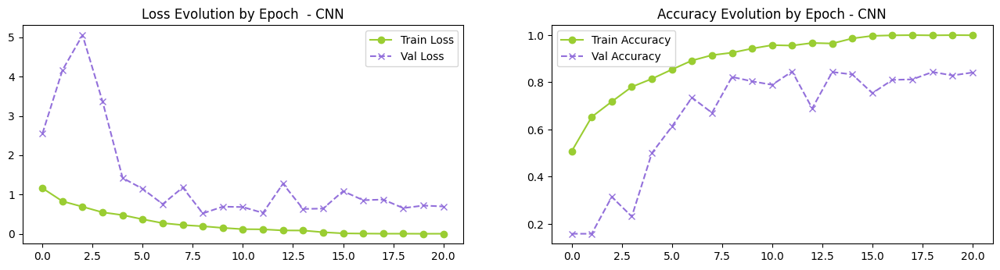

In [ ]:
# Plot loss and accuracy plot
plot_history(cnn_history, cnn_model, "CNN")


📊 Classification Report:
                  precision    recall  f1-score   support

    glioma_tumor       0.93      0.75      0.83       132
meningioma_tumor       0.85      0.68      0.75       145
        no_tumor       0.76      0.83      0.79        70
 pituitary_tumor       0.75      0.99      0.86       152

        accuracy                           0.81       499
       macro avg       0.82      0.81      0.81       499
    weighted avg       0.83      0.81      0.81       499



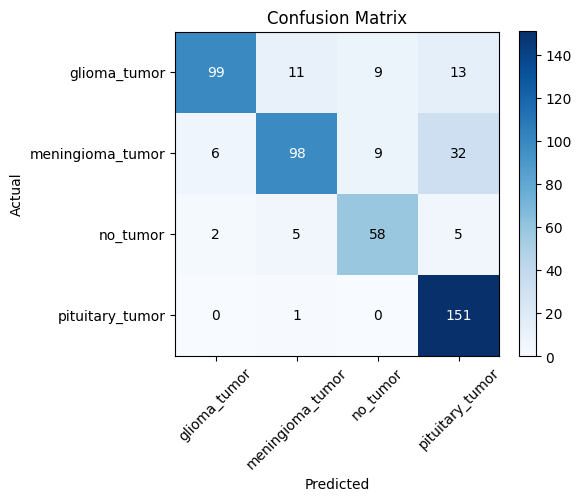

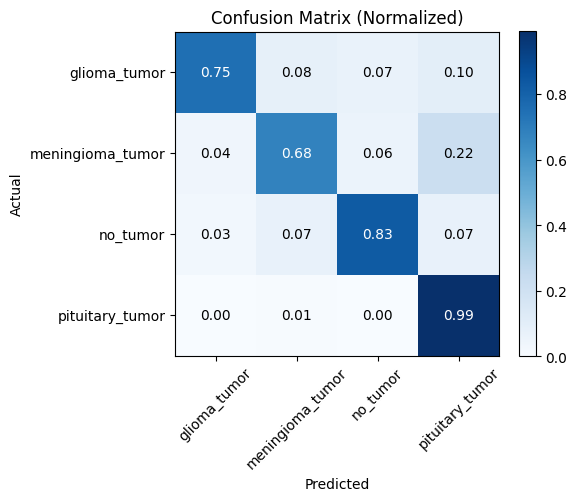

In [ ]:
# Classification Report for CNN
report, y_true, y_pred = evaluate_model(best_cnn_model, test_ds, class_names)

# Plot confusion matrix (counts)
cm = plot_confusion_matrix(y_true, y_pred, class_names, normalize=False)

# Plot confusion matrix (percentages)
cm_norm = plot_confusion_matrix(y_true, y_pred, class_names, normalize=True)

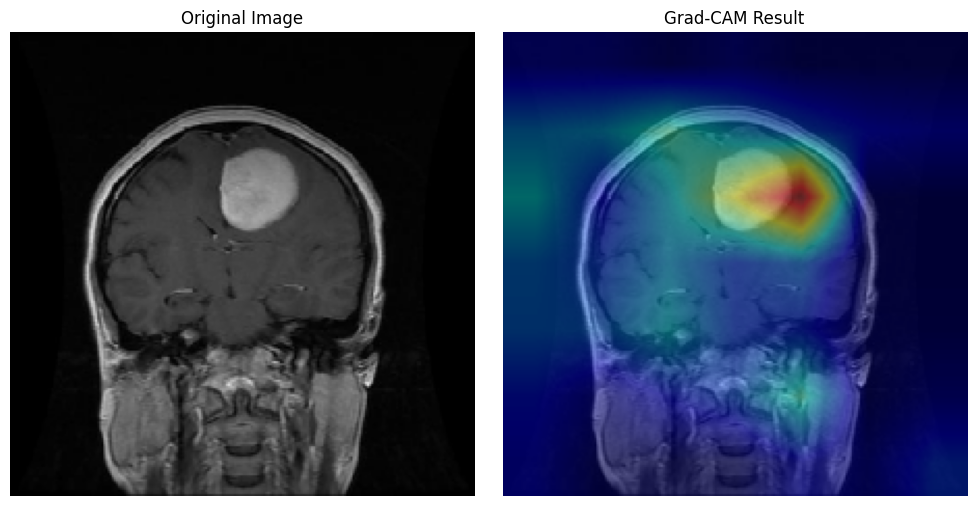

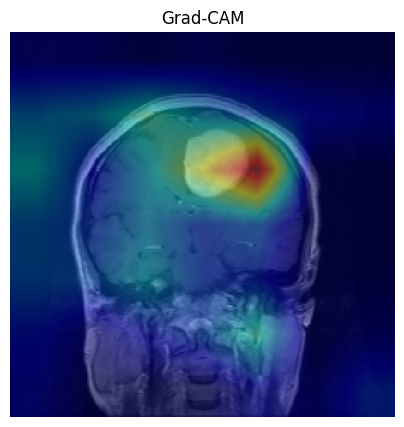

Predicted class: meningioma_tumor (1)


In [ ]:
compute_gradcam(best_cnn_model, "/content/drive/MyDrive/Brain Tumor/MergedData/meningioma_tumor/m (21).jpg",
                layer_name='conv2d_5', class_labels=class_names);

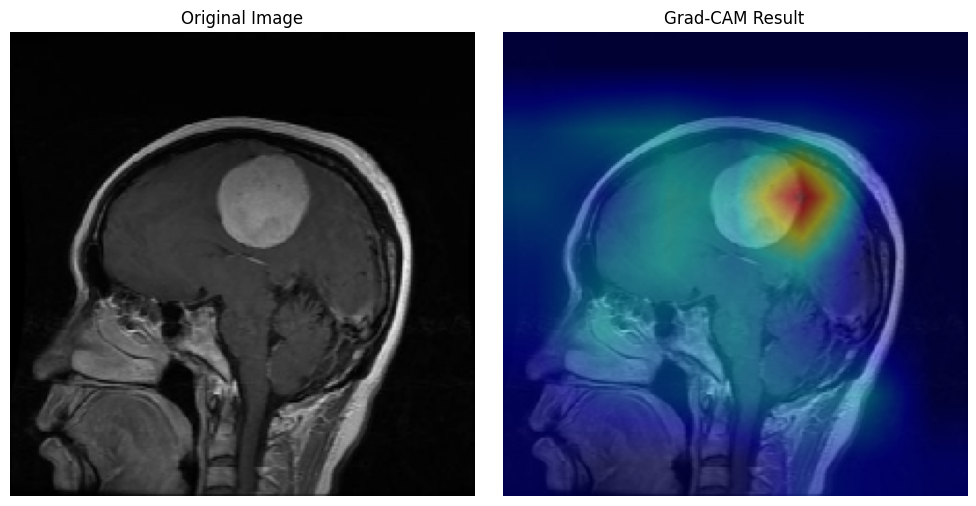

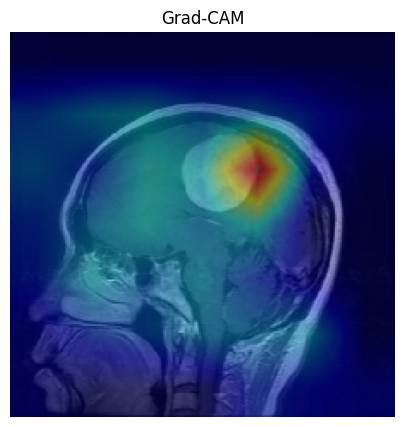

Predicted class: meningioma_tumor (1)


In [ ]:
compute_gradcam(best_cnn_model, "/content/drive/MyDrive/Brain Tumor/MergedData/meningioma_tumor/m2 (62).jpg",
                layer_name='conv2d_5', class_labels=class_names);

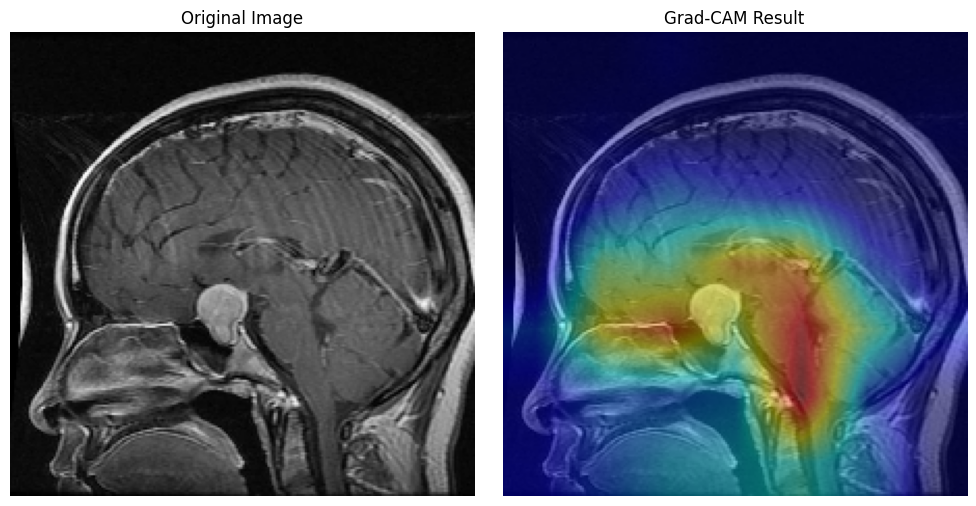

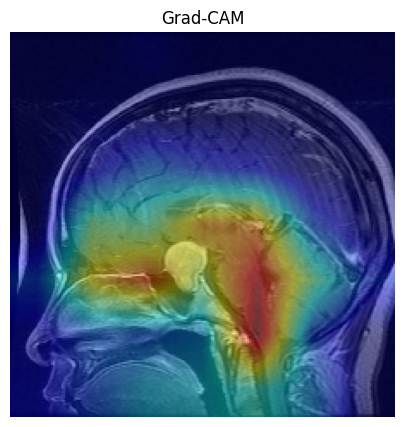

Predicted class: pituitary_tumor (3)


In [ ]:
compute_gradcam(best_cnn_model, "/content/drive/MyDrive/Brain Tumor/MergedData/pituitary_tumor/image(68).jpg",
                layer_name='conv2d_5', class_labels=class_names);

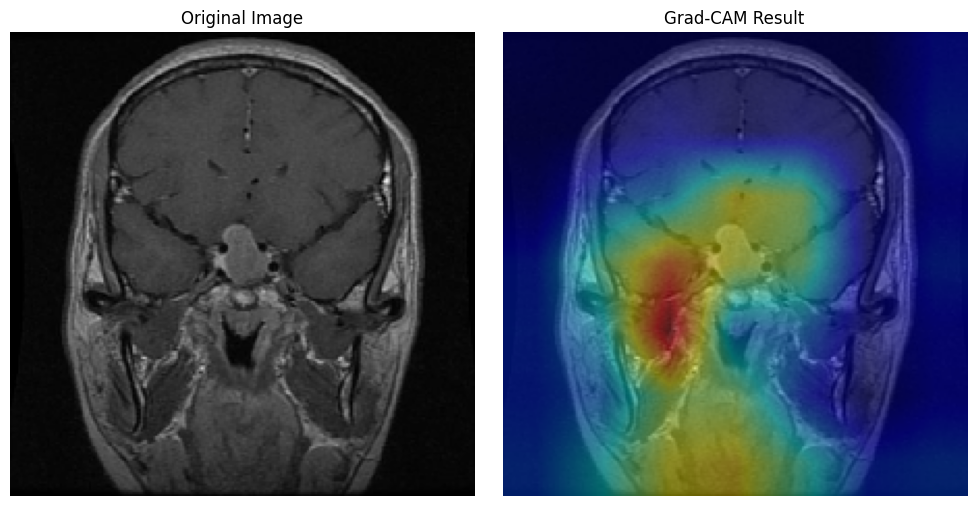

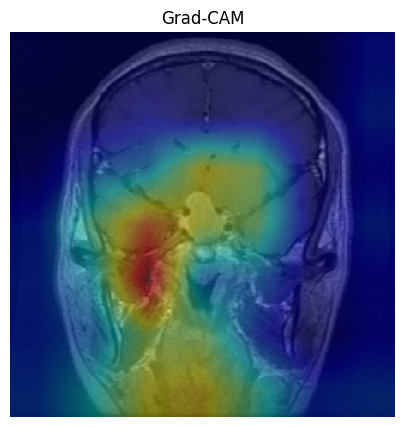

Predicted class: pituitary_tumor (3)


In [ ]:
compute_gradcam(best_cnn_model, "/content/drive/MyDrive/Brain Tumor/MergedData/pituitary_tumor/p (40).jpg",
                layer_name='conv2d_5', class_labels=class_names);

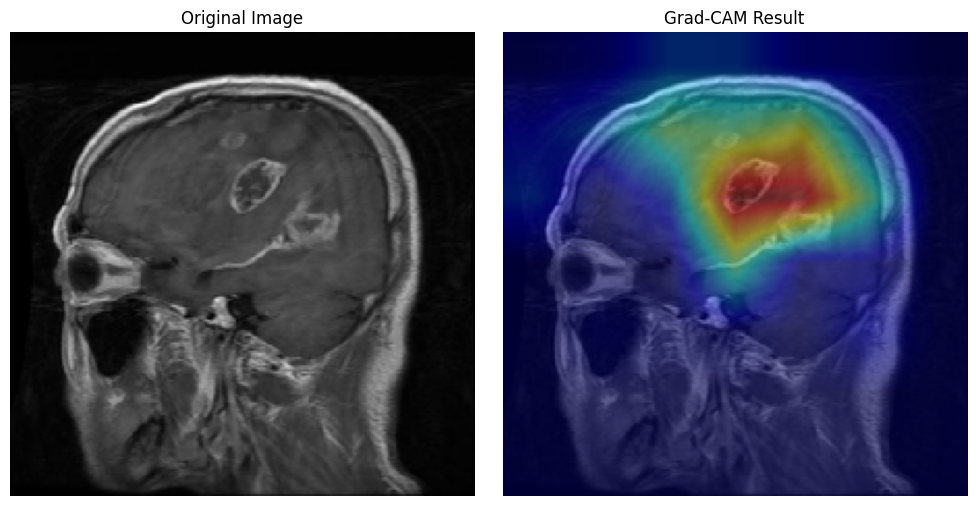

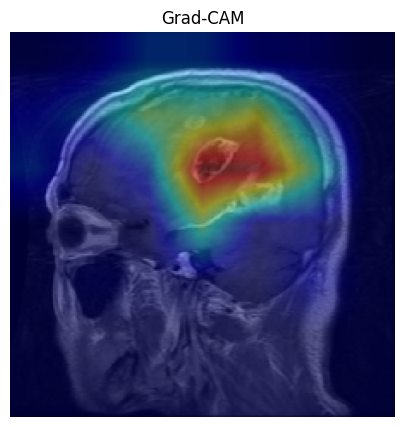

Predicted class: glioma_tumor (0)


In [ ]:
compute_gradcam(best_cnn_model, "/content/drive/MyDrive/Brain Tumor/MergedData/glioma_tumor/gg (432).jpg",
                layer_name='conv2d_5', class_labels=class_names);

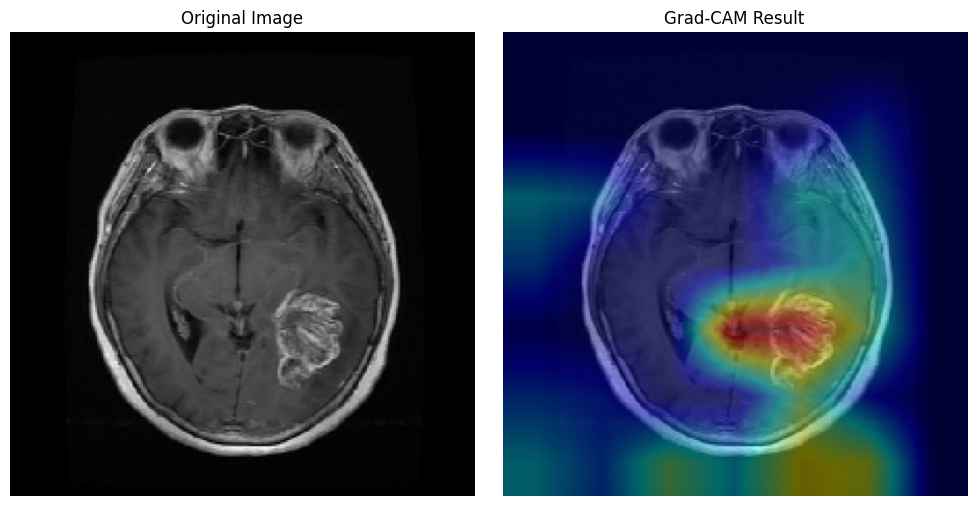

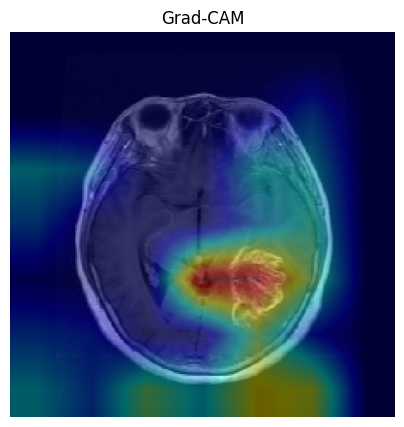

Predicted class: glioma_tumor (0)


In [ ]:
compute_gradcam(best_cnn_model, "/content/drive/MyDrive/Brain Tumor/MergedData/glioma_tumor/gg (8).jpg",
                layer_name='conv2d_5', class_labels=class_names);

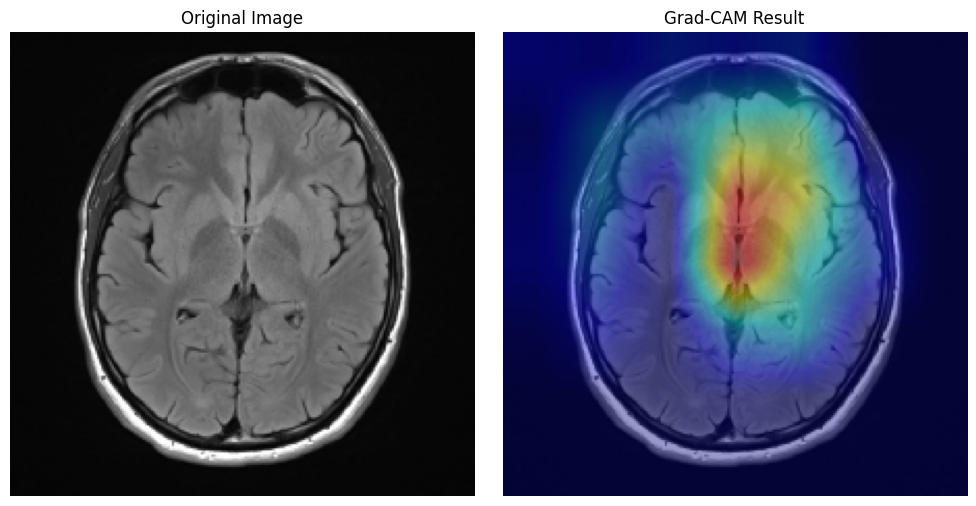

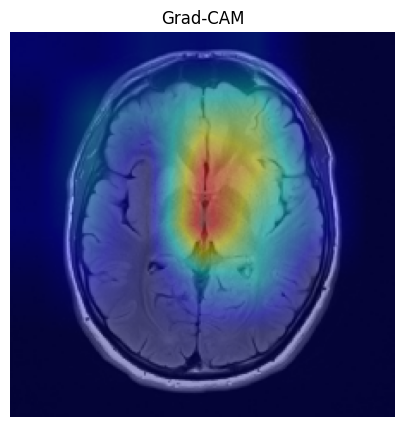

Predicted class: no_tumor (2)


In [ ]:
compute_gradcam(best_cnn_model, "/content/drive/MyDrive/Brain Tumor/MergedData/no_tumor/image (18).jpg",
                layer_name='conv2d_5', class_labels=class_names);

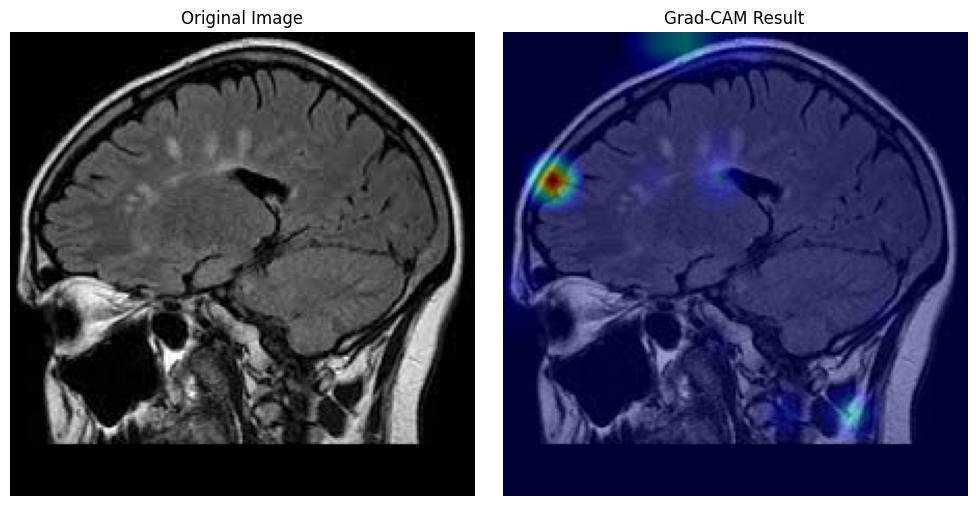

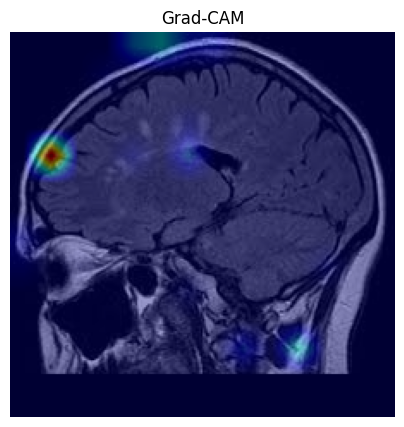

Predicted class: no_tumor (2)


In [ ]:
compute_gradcam(best_cnn_model, "/content/drive/MyDrive/Brain Tumor/MergedData/no_tumor/image (10).jpg",
                layer_name='conv2d_4', class_labels=class_names);

# Model - VGG16 (Fine Tuned Transfer Learning)

In [ ]:
# clear tf session
tf.keras.backend.clear_session()

In [ ]:
# Load VGG16 model with pre-trained weights
base_model = VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Add global average pooling layer
x = layers.GlobalAveragePooling2D()(base_model.output)

# Dense layers
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.2)(x)


# Add fully connected layer with softmax activation
predictions = Dense(4, activation='softmax')(x)

# Create the model
vgg_model = Model(inputs=base_model.input, outputs=predictions)

# Print model summary
vgg_model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 14,879,428 (56.76 MB)

 Trainable params: 164,740 (643.52 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
# Compile model
vgg_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Set Callbacks
vgg_callbacks = get_callbacks("best_vgg16_model.keras")

print("Complilation & setting callbacks complete")

Complilation & setting callbacks complete


In [ ]:
# Train VGG16 Model

vgg_history = vgg_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    class_weight = class_weights,
    callbacks=vgg_callbacks
)

Epoch 1/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.3093 - loss: 1.3741
Epoch 1: val_loss improved from inf to 1.03303, saving model to best_vgg16_model.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 15s 177ms/step - accuracy: 0.3106 - loss: 1.3725 - val_accuracy: 0.5229 - val_loss: 1.0330 - learning_rate: 0.0010
Epoch 2/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.5769 - loss: 1.0106
Epoch 2: val_loss improved from 1.03303 to 0.81413, saving model to best_vgg16_model.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 13s 180ms/step - accuracy: 0.5774 - loss: 1.0096 - val_accuracy: 0.7271 - val_loss: 0.8141 - learning_rate: 0.0010
Epoch 3/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.6600 - loss: 0.8307
Epoch 3: val_loss improved from 0.81413 to 0.66872, saving model to best_vgg16_model.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 13s 183ms/step - accuracy: 0.6601 - loss: 0.8303 - val_accuracy: 0.7563 - val_loss: 0.6687 - learning_rate: 0.0010
Epoch 4/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/

In [ ]:
### STAGE 2 OF VGG16 FOR FINE-TUNING ###

# Unfreeze last conv block - (block5)
for layer in base_model.layers:
    if layer.name.startswith("block5"):
        layer.trainable = True
    else:
        layer.trainable = False

# Recompile with low LR
vgg_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Continue training (fine-tuning)
fine_tune_history = vgg_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=vgg_history.epoch[-1] + 20,   # continue training
    initial_epoch=vgg_history.epoch[-1],
    callbacks=vgg_callbacks,
    class_weight=class_weights
)

Epoch 36/55
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.8621 - loss: 0.3181
Epoch 36: val_loss improved from 0.45976 to 0.42750, saving model to best_vgg16_model.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8623 - loss: 0.3179 - val_accuracy: 0.8333 - val_loss: 0.4275 - learning_rate: 1.0000e-05
Epoch 37/55
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9123 - loss: 0.2281
Epoch 37: val_loss did not improve from 0.42750
72/72 ━━━━━━━━━━━━━━━━━━━━ 14s 195ms/step - accuracy: 0.9122 - loss: 0.2282 - val_accuracy: 0.8396 - val_loss: 0.4567 - learning_rate: 1.0000e-05
Epoch 38/55
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.9358 - loss: 0.1775
Epoch 38: val_loss did not improve from 0.42750
72/72 ━━━━━━━━━━━━━━━━━━━━ 14s 196ms/step - accuracy: 0.9357 - loss: 0.1775 - val_accuracy: 0.8375 - val_loss: 0.4584 - learning_rate: 1.0000e-05
Epoch 39/55
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.9375 - loss: 0.1626
Epoch 39: val_loss improve

In [ ]:
best_vgg_model, (test_loss, test_acc) = load_and_evaluate_model(
    "best_vgg16_model.keras", test_ds
)

16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 144ms/step - accuracy: 0.8625 - loss: 0.4079
Model from 'best_vgg16_model.keras' -> Loss: 0.3738, Accuracy: 0.8798


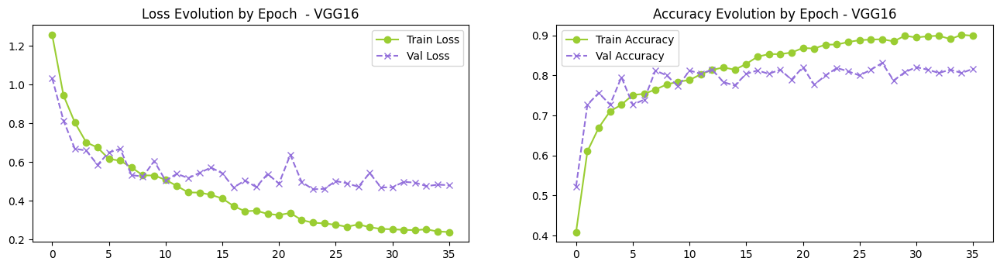

In [ ]:
# plot accuracy and loss evolution for Conv CNN model
plot_history(vgg_history, vgg_model, 'VGG16')

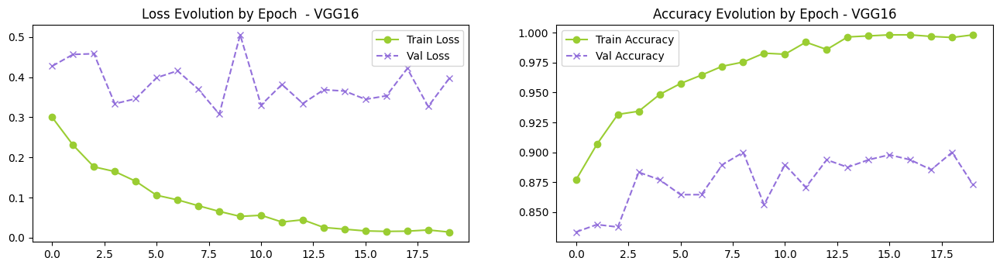

In [ ]:
# plot accuracy and loss evolution for Conv CNN model
plot_history(fine_tune_history, vgg_model, 'VGG16')

In [ ]:
def merge_histories(h1, h2):
    history = {}
    for key in h1.history.keys():
        history[key] = h1.history[key] + h2.history[key]
    return history

full_history = merge_histories(vgg_history, fine_tune_history)

class DummyHistory:
    def __init__(self, history_dict):
        self.history = history_dict

full_history_obj = DummyHistory(full_history)

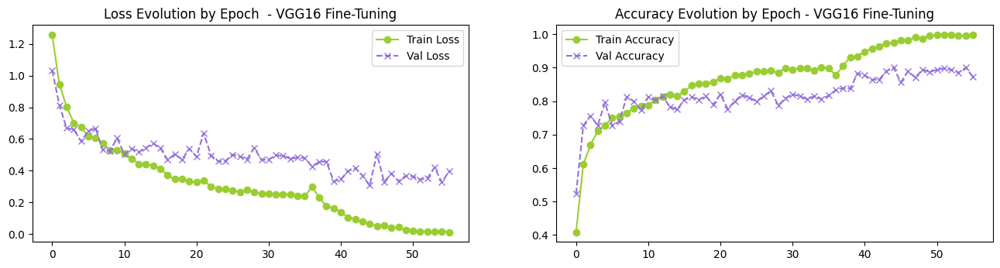

In [ ]:
plot_history(full_history_obj, vgg_model, "VGG16 Fine-Tuning")


📊 Classification Report:
                  precision    recall  f1-score   support

    glioma_tumor       0.95      0.81      0.87       132
meningioma_tumor       0.84      0.82      0.83       145
        no_tumor       0.90      0.91      0.91        70
 pituitary_tumor       0.86      0.98      0.92       152

        accuracy                           0.88       499
       macro avg       0.89      0.88      0.88       499
    weighted avg       0.88      0.88      0.88       499



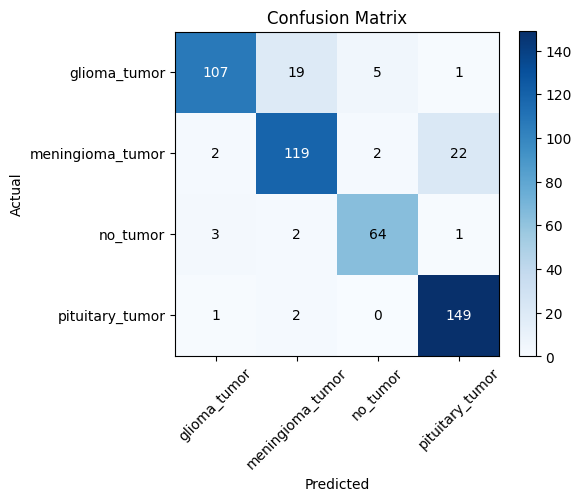

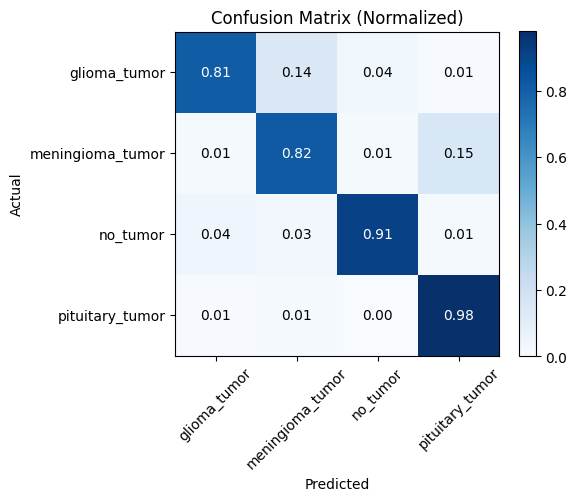

In [ ]:
# Classification Report for VGG16
report, y_true, y_pred = evaluate_model(best_vgg_model, test_ds, class_names)

# Plot confusion matrix (counts)
cm = plot_confusion_matrix(y_true, y_pred, class_names, normalize=False)

# Plot confusion matrix (percentages)
cm_norm = plot_confusion_matrix(y_true, y_pred, class_names, normalize=True)

In [ ]:
# Check for last convolutional layer
for i, layer in enumerate(vgg_model.layers):
    print(i, layer.name, layer.output.shape)

0 input_layer (None, 224, 224, 3)
1 block1_conv1 (None, 224, 224, 64)
2 block1_conv2 (None, 224, 224, 64)
3 block1_pool (None, 112, 112, 64)
4 block2_conv1 (None, 112, 112, 128)
5 block2_conv2 (None, 112, 112, 128)
6 block2_pool (None, 56, 56, 128)
7 block3_conv1 (None, 56, 56, 256)
8 block3_conv2 (None, 56, 56, 256)
9 block3_conv3 (None, 56, 56, 256)
10 block3_pool (None, 28, 28, 256)
11 block4_conv1 (None, 28, 28, 512)
12 block4_conv2 (None, 28, 28, 512)
13 block4_conv3 (None, 28, 28, 512)
14 block4_pool (None, 14, 14, 512)
15 block5_conv1 (None, 14, 14, 512)
16 block5_conv2 (None, 14, 14, 512)
17 block5_conv3 (None, 14, 14, 512)
18 block5_pool (None, 7, 7, 512)
19 global_average_pooling2d (None, 512)
20 dense (None, 256)
21 dropout (None, 256)
22 dense_1 (None, 128)
23 dropout_1 (None, 128)
24 dense_2 (None, 4)


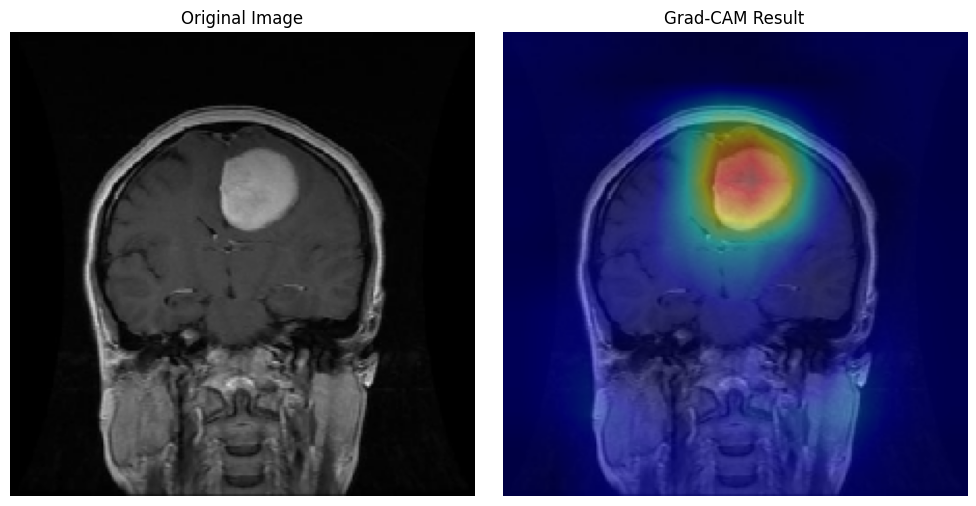

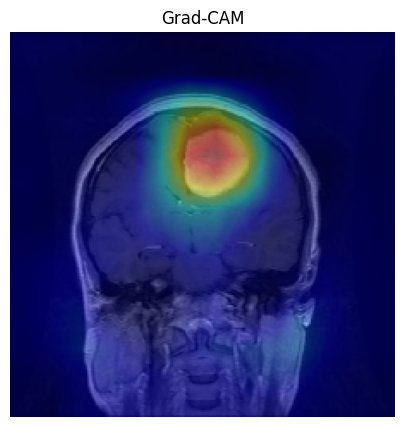

Predicted class: meningioma_tumor (1)


In [ ]:
compute_gradcam(best_vgg_model, "/content/drive/MyDrive/Brain Tumor/MergedData/meningioma_tumor/m (21).jpg",
                layer_name='block5_conv3', class_labels=class_names);

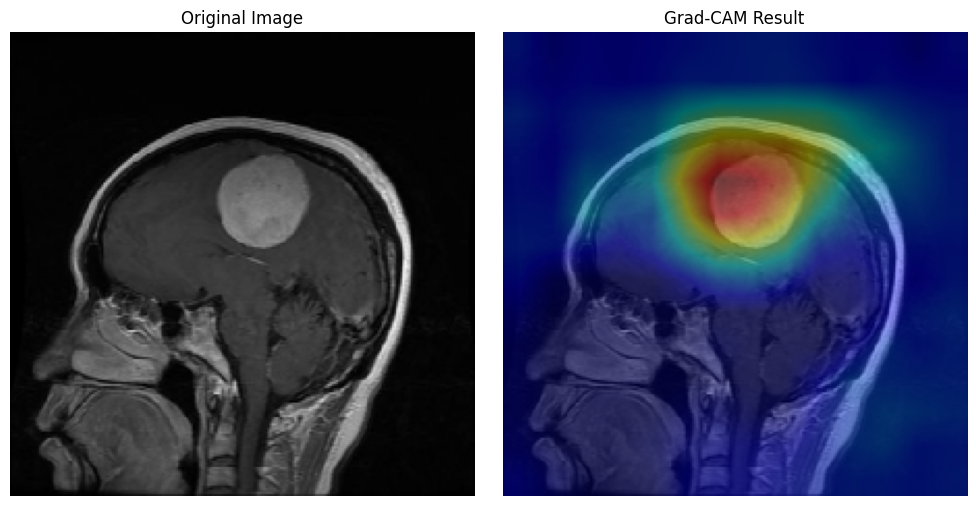

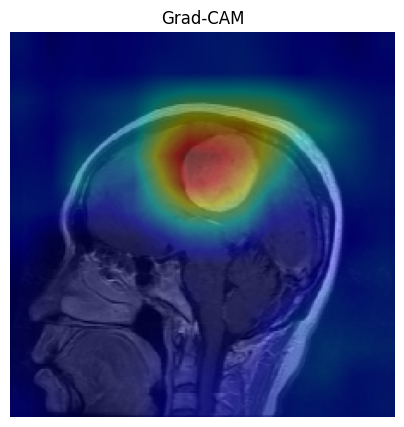

Predicted class: meningioma_tumor (1)


In [ ]:
compute_gradcam(best_vgg_model, "/content/drive/MyDrive/Brain Tumor/MergedData/meningioma_tumor/m2 (62).jpg",
                layer_name='block5_conv3', class_labels=class_names);

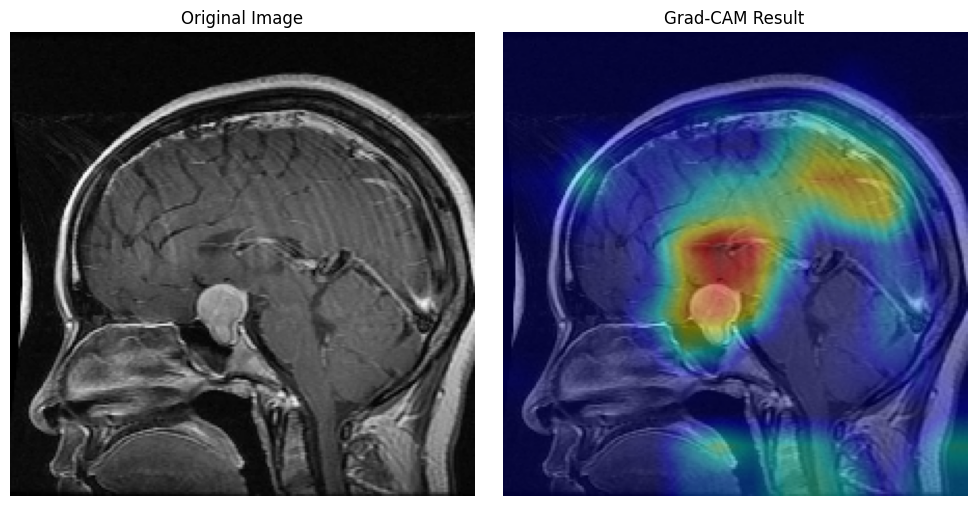

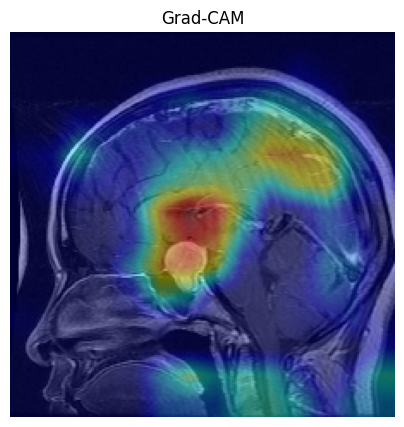

Predicted class: pituitary_tumor (3)


In [ ]:
compute_gradcam(best_vgg_model, "/content/drive/MyDrive/Brain Tumor/MergedData/pituitary_tumor/image(68).jpg",
                layer_name='block5_conv3', class_labels=class_names);

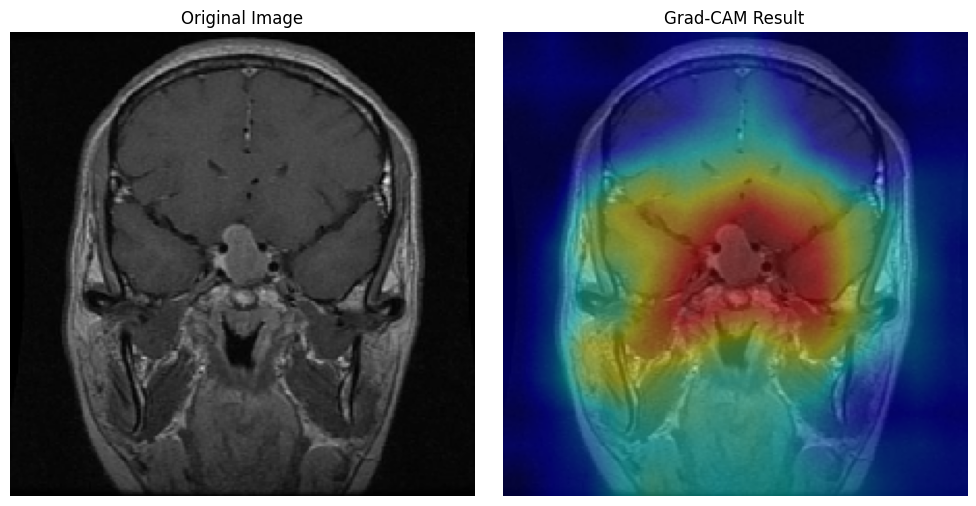

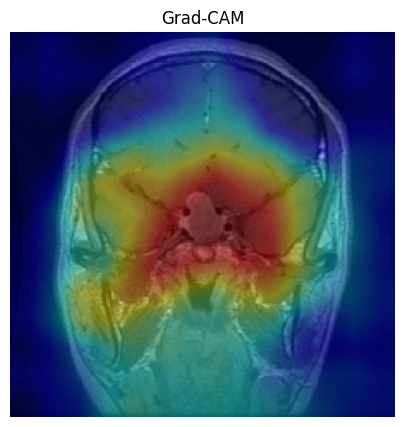

Predicted class: pituitary_tumor (3)


In [ ]:
compute_gradcam(best_vgg_model, "/content/drive/MyDrive/Brain Tumor/MergedData/pituitary_tumor/p (40).jpg",
                layer_name='block5_conv3', class_labels=class_names);

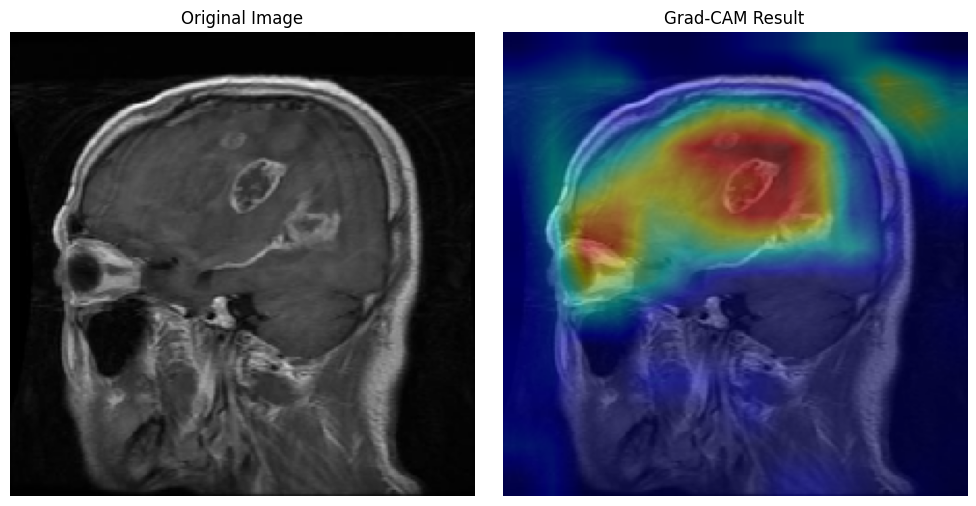

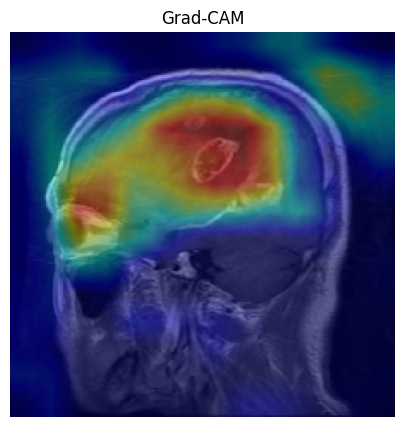

Predicted class: glioma_tumor (0)


In [ ]:
compute_gradcam(best_vgg_model, "/content/drive/MyDrive/Brain Tumor/MergedData/glioma_tumor/gg (432).jpg",
                layer_name='block5_conv3', class_labels=class_names);

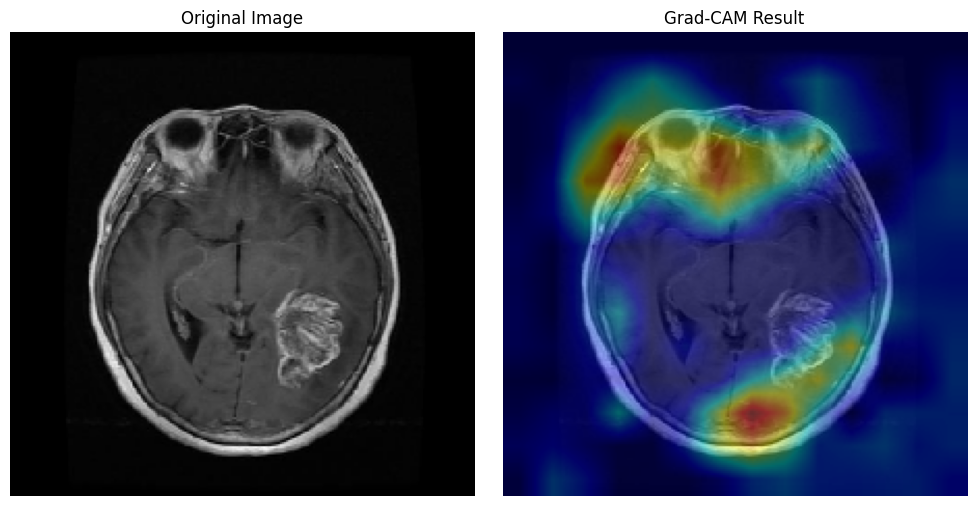

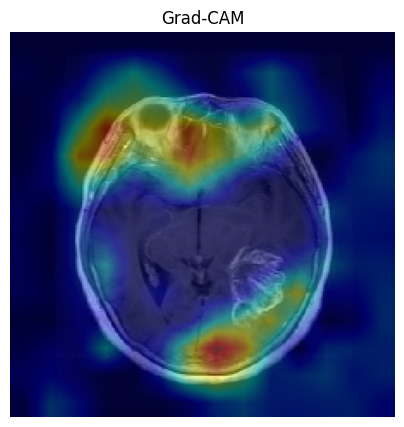

Predicted class: glioma_tumor (0)


In [ ]:
compute_gradcam(best_vgg_model, "/content/drive/MyDrive/Brain Tumor/MergedData/glioma_tumor/gg (8).jpg",
                layer_name='block5_conv3', class_labels=class_names);

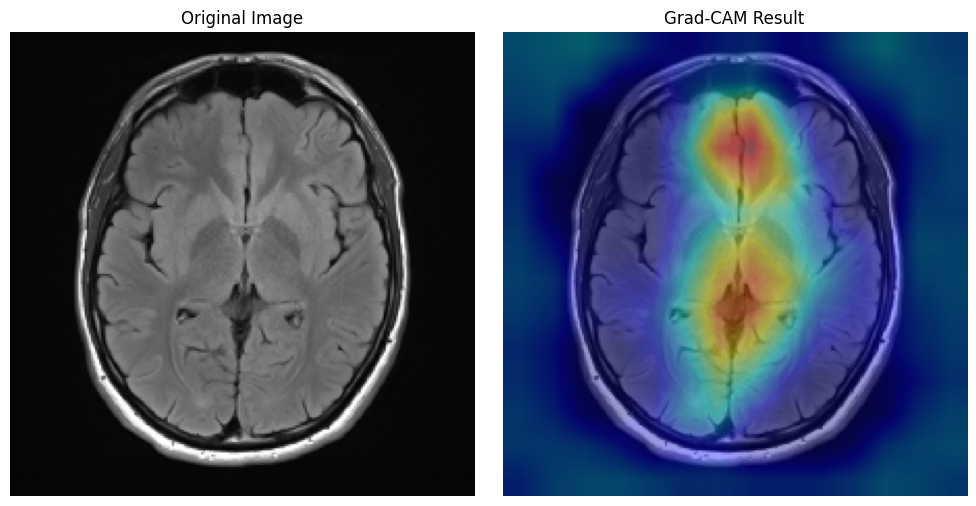

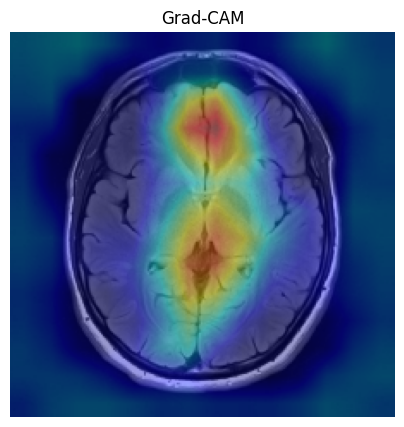

Predicted class: no_tumor (2)


In [ ]:
compute_gradcam(best_vgg_model, "/content/drive/MyDrive/Brain Tumor/MergedData/no_tumor/image (18).jpg",
                layer_name='block5_conv3', class_labels=class_names);

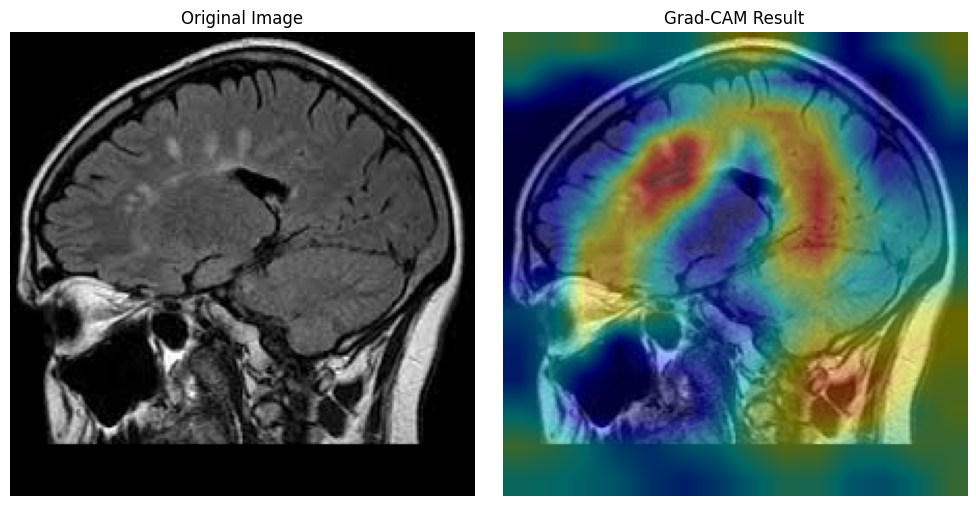

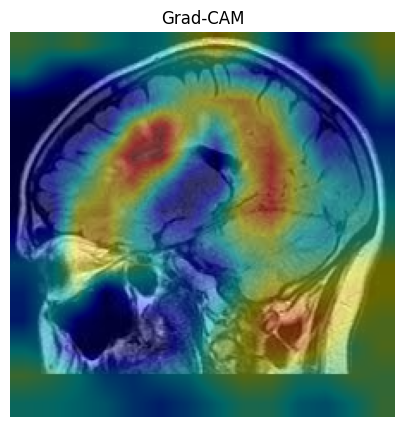

Predicted class: no_tumor (2)


In [ ]:
compute_gradcam(best_vgg_model, "/content/drive/MyDrive/Brain Tumor/MergedData/no_tumor/image (10).jpg",
                layer_name='block5_conv3', class_labels=class_names);